In [1]:
# Стандартна бібліотека
import os
import sys
import time
import itertools
import json
import random
from pathlib import Path
from typing import Union
from dataclasses import dataclass
from collections import defaultdict, Counter
from typing import Any, Dict, List, Optional, Tuple
import zipfile

# Наукові обчислення та табличні дані
import numpy as np
import pandas as pd
from tqdm.auto import tqdm

# Візуалізація
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import ListedColormap

# Комп'ютерний зір та зображення
import cv2
from PIL import Image
from IPython.display import display

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, Sampler
from torch.nn.utils import clip_grad_norm_
import torch.amp

# Аугментації
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Перевірка CUDA
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")
    print(f"CUDA version: {torch.version.cuda}")
    print(f"torch current device: {torch.cuda.current_device()}")

    # ── Оптимізація GPU ──
    torch.backends.cudnn.benchmark = True       # auto-tune conv алгоритмів під фіксований input size
    torch.backends.cuda.matmul.allow_tf32 = True  # TF32 для матричних множень (Ampere+)
    torch.backends.cudnn.allow_tf32 = True        # TF32 для convolution
    print("cudnn.benchmark = True, TF32 enabled")

print(f"Training device: {device}")


PyTorch version: 2.10.0+cu130
CUDA available: True
CUDA device: NVIDIA GeForce RTX 3060
CUDA version: 13.0
torch current device: 0
cudnn.benchmark = True, TF32 enabled
Training device: cuda:0


```
#!/bin/bash
curl -L -o ~/Downloads/div2k-dataset.zip\
  https://www.kaggle.com/api/v1/datasets/download/joe1995/div2k-dataset

```

```
  https://www.kaggle.com/competitions/denoising-dirty-documents/data
```

In [2]:
ROOT_DIR = Path.cwd()
DATA_DIR = ROOT_DIR / "data"

# Шляхи до даних
DENOISING_DIR = DATA_DIR / "denoising-dirty-documents"
DIV2K_DIR = DATA_DIR / "div2k-dataset"

# Шляхи до zip-архівів
TARGET_ZIPS = [
    ROOT_DIR / "denoising-dirty-documents.zip",
    ROOT_DIR / "div2k-dataset.zip"
]

# Створення основної папки для даних
DATA_DIR.mkdir(exist_ok=True)

# --- Функції для обробки архівів ---

def unzip_recursive(zip_path: Path, extract_to: Path):
    """
    Розархівовує zip-файл у вказану папку, якщо папка призначення
    не існує або порожня.
    """
    if not zip_path.exists():
        print(f"Zip-файл не знайдено: {zip_path.name}")
        return

    if extract_to.exists() and any(extract_to.iterdir()):
        print(f"Папка {extract_to.name} вже існує і не порожня. Пропускаємо розархівацію.")
        return

    extract_to.mkdir(parents=True, exist_ok=True)
    try:
        with zipfile.ZipFile(zip_path, 'r') as zf:
            zf.extractall(extract_to)
            print(f"Архів {zip_path.name} успішно розархівовано у {extract_to.name}")
    except zipfile.BadZipFile:
        print(f"Пропущено пошкоджений zip-файл: {zip_path.name}")
        return

    if zip_path.is_relative_to(DATA_DIR) and zip_path.exists():
        zip_path.unlink()

def process_zips(base_data_dir: Path):
    """
    Рекурсивно шукає вкладені zip-архіви та розархівовує їх.
    """
    found_zip = True
    while found_zip:
        found_zip = False
        for root, _, files in os.walk(base_data_dir):
            for file in files:
                if file.endswith('.zip'):
                    z_path = Path(root) / file
                    ex_path = Path(root) / z_path.stem
                    print(f"Знайдено вкладений архів {z_path.name}, розархівація у {ex_path.name}")
                    unzip_recursive(z_path, ex_path)
                    found_zip = True
                    break
            if found_zip:
                break

def flatten_duplicate_dirs(base_path: Path):
    """
    Піднімає файли на рівень вище, якщо папка та вкладена в неї папка
    мають однакові імена (щоб не було ../test/test/img).
    """
    flattened_something = True
    while flattened_something:
        flattened_something = False
        for root, dirs, _ in os.walk(base_path, topdown=False):
            current_dir = Path(root)
            if not current_dir.exists() or current_dir == base_path:
                continue
            
            for d in dirs:
                if d == current_dir.name:
                    child_dir = current_dir / d
                    if child_dir.exists() and child_dir.is_dir():
                        print(f"Злиття папок з однаковим ім'ям: {child_dir.name} -> {current_dir.name}")
                        for item in child_dir.iterdir():
                            dest_path = current_dir / item.name
                            try:
                                shutil.move(str(item), str(dest_path))
                            except shutil.Error as e:
                                print(f"Помилка переміщення {item.name} до {dest_path.name}: {e}")

                        try:
                            child_dir.rmdir()
                            flattened_something = True
                        except OSError as e:
                            print(f"Не вдалося видалити {child_dir.name}: {e}")
            if flattened_something:
                break

In [3]:
# 1. Витягуємо кореневі архіви
for z_path in TARGET_ZIPS:
    ex_path = DATA_DIR / z_path.stem

    # Skip extraction if folder already exists and is not empty.
    if ex_path.exists() and any(ex_path.iterdir()):
        print(f"Пропуск: {ex_path.name} вже розпаковано")
        continue

    if not z_path.exists():
        print(f"Пропуск: архів {z_path.name} не знайдено")
        continue

    print(f"Розархівація кореневого архіву {z_path.name} у {ex_path.name}")
    try:
        unzip_recursive(z_path, ex_path)
    except Exception as e:
        print(f"Попередження: не вдалося розпакувати {z_path.name}: {e}")

# 2. Шукаємо та розархівовуємо вкладені zip (рекурсивний розархіватор)
try:
    process_zips(DATA_DIR)
except Exception as e:
    print(f"Попередження під час process_zips: {e}")

# 3. Позбавляємося вкладеностей типу test/test
try:
    flatten_duplicate_dirs(DATA_DIR)
except Exception as e:
    print(f"Попередження під час flatten_duplicate_dirs: {e}")

print("Розархівацію та структурування завершено.")

Пропуск: denoising-dirty-documents вже розпаковано
Пропуск: div2k-dataset вже розпаковано
Розархівацію та структурування завершено.


In [4]:

DENOISING_TRAIN_DIR = DENOISING_DIR / "train"
DENOISING_TEST_DIR = DENOISING_DIR / "test"
DENOISING_CLEANED_DIR = DENOISING_DIR / "train_cleaned"
DENOISING_SAMPLESUBMISSIONCSV = DENOISING_DIR / "sampleSubmission.csv"
DIV2K_TRAIN_HR_DIR = DIV2K_DIR / "DIV2K_train_HR"
DIV2K_VALID_HR_DIR = DIV2K_DIR / "DIV2K_valid_HR"


In [5]:

# ── Конфігурація датасетів ─────────────────────────────────────────────
PATCH_SIZE   = 256        # розмір кропу (H x W)
SCALE        = 1          # 1 = той самий розмір (denoising / restoration)
VAL_SPLIT    = 0.1        # частка валідаційних зображень
RANDOM_SEED  = 42
BATCH_SIZE   = 8
NUM_WORKERS  = 4

IMG_EXTENSIONS = {".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff"}

def gather_images(folder: Path) -> List[Path]:
    """Рекурсивно збирає всі зображення у папці."""
    return sorted(
        p for p in folder.rglob("*") if p.suffix.lower() in IMG_EXTENSIONS
    )

def make_split(
    files: List[Path],
    val_ratio: float = VAL_SPLIT,
    seed: int = RANDOM_SEED,
) -> Tuple[List[Path], List[Path]]:
    """Детерміноване перемішування та розбивка на train / val."""
    rng = random.Random(seed)
    shuffled = files.copy()
    rng.shuffle(shuffled)
    n_val = max(1, int(len(shuffled) * val_ratio))
    return shuffled[n_val:], shuffled[:n_val]     # (train, val)


In [6]:

# ── Синтетична деградація для DIV2K ──────────────────────────────────
def apply_degradation(img: np.ndarray) -> np.ndarray:
    """
    Застосовує випадковий набір деградацій до RGB-зображення (uint8).

    Деградації (кожна застосовується незалежно з певною ймовірністю):
      • Gaussian noise
      • Gaussian blur
      • JPEG-артефакти
      • Downscale → Upscale (пікселізація)
    """
    out = img.copy()

    # Gaussian noise
    if random.random() < 0.8:
        sigma = random.uniform(5, 50)
        noise = np.random.normal(0, sigma, out.shape).astype(np.float32)
        out = np.clip(out.astype(np.float32) + noise, 0, 255).astype(np.uint8)

    # Gaussian blur
    if random.random() < 0.5:
        ksize = random.choice([3, 5, 7])
        out = cv2.GaussianBlur(out, (ksize, ksize), 0)

    # JPEG compression
    if random.random() < 0.5:
        quality = random.randint(10, 60)
        encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), quality]
        _, enc = cv2.imencode(".jpg", out, encode_param)
        out = cv2.imdecode(enc, cv2.IMREAD_COLOR)

    # Downscale → Upscale
    if random.random() < 0.3:
        h, w = out.shape[:2]
        factor = random.choice([2, 4])
        small = cv2.resize(out, (w // factor, h // factor), interpolation=cv2.INTER_AREA)
        out   = cv2.resize(small, (w, h), interpolation=cv2.INTER_CUBIC)

    return out


# ── DIV2K Degraded Dataset ────────────────────────────────────────────
class DIV2KDegradedDataset(Dataset):
    """
    Повертає пару (noisy, clean) для синтетичної задачі відновлення.

    Із кожного чистого HR-зображення DIV2K вирізається патч;
    потім до нього застосовуються синтетичні деградації.
    Інтерфейс сумісний із DenoisingDataset: ключі 'noisy' і 'clean'.

    Параметри
    ----------
    files        : список шляхів до HR-зображень
    patch_size   : розмір кропу
    augment      : якщо True — застосовуються flip/rotate аугментації
    grayscale    : True → виводить 1-канальні тензори (як у DenoisingDataset)
    """

    def __init__(
        self,
        files: List[Path],
        patch_size: int = PATCH_SIZE,
        augment: bool = True,
        grayscale: bool = False,
    ):
        self.files      = files
        self.patch_size = patch_size
        self.augment    = augment
        self.grayscale  = grayscale

        self._aug = A.Compose([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
        ]) if augment else None

    def __len__(self) -> int:
        return len(self.files)

    def __getitem__(self, idx: int) -> Dict[str, torch.Tensor]:
        img_bgr = cv2.imread(str(self.files[idx]))
        clean   = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        # random crop
        h, w = clean.shape[:2]
        ps   = self.patch_size
        if h > ps and w > ps:
            y     = random.randint(0, h - ps)
            x     = random.randint(0, w - ps)
            clean = clean[y : y + ps, x : x + ps]
        else:
            clean = cv2.resize(clean, (ps, ps), interpolation=cv2.INTER_AREA)

        # flip / rotate
        if self._aug:
            clean = self._aug(image=clean)["image"]

        # синтетична деградація на копії
        noisy = apply_degradation(clean)

        if self.grayscale:
            clean = cv2.cvtColor(clean, cv2.COLOR_RGB2GRAY)[..., None]
            noisy = cv2.cvtColor(noisy, cv2.COLOR_RGB2GRAY)[..., None]

        clean_t = torch.from_numpy(clean).permute(2, 0, 1).float() / 255.0
        noisy_t = torch.from_numpy(noisy).permute(2, 0, 1).float() / 255.0

        return {"noisy": noisy_t, "clean": clean_t}


# ── Denoising Dataset ─────────────────────────────────────────────────
class DenoisingDataset(Dataset):
    """
    Повертає пару (noisy, clean) для задачі відновлення документів.

    Параметри
    ----------
    noisy_files : список шляхів до зашумлених зображень
    clean_dir   : папка з відповідними «чистими» зображеннями
    patch_size  : розмір кропу (0 = без кропу, повне зображення)
    augment     : якщо True — flip/rotate аугментації
    """

    def __init__(
        self,
        noisy_files: List[Path],
        clean_dir: Path,
        patch_size: int = PATCH_SIZE,
        augment: bool = False,
    ):
        self.pairs: List[Tuple[Path, Path]] = []
        for nf in noisy_files:
            cf = clean_dir / nf.name
            if cf.exists():
                self.pairs.append((nf, cf))

        self.patch_size = patch_size
        self._aug = A.Compose([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
        ], additional_targets={"clean": "image"}) if augment else None

    def __len__(self) -> int:
        return len(self.pairs)

    def __getitem__(self, idx: int) -> Dict[str, torch.Tensor]:
        noisy_path, clean_path = self.pairs[idx]

        noisy = cv2.imread(str(noisy_path), cv2.IMREAD_GRAYSCALE)
        clean = cv2.imread(str(clean_path), cv2.IMREAD_GRAYSCALE)

        # спільний crop
        combined = np.stack([noisy, clean], axis=-1)
        ps = self.patch_size
        if ps and combined.shape[0] > ps and combined.shape[1] > ps:
            h, w = combined.shape[:2]
            y = random.randint(0, h - ps)
            x = random.randint(0, w - ps)
            combined = combined[y : y + ps, x : x + ps]

        noisy_out = combined[..., 0:1]
        clean_out = combined[..., 1:2]

        if self._aug:
            aug     = self._aug(image=noisy_out, clean=clean_out)
            noisy_t = torch.from_numpy(aug["image"]).permute(2, 0, 1)
            clean_t = torch.from_numpy(aug["clean"]).permute(2, 0, 1)
        else:
            noisy_t = torch.from_numpy(noisy_out).permute(2, 0, 1)
            clean_t = torch.from_numpy(clean_out).permute(2, 0, 1)

        return {
            "noisy": noisy_t.float() / 255.0,
            "clean": clean_t.float() / 255.0,
        }


In [7]:

from torch.utils.data import ConcatDataset

# ── Спліт DIV2K_TRAIN_HR → синтетичний датасет ───────────────────────
div2k_all_files   = gather_images(DIV2K_TRAIN_HR_DIR)
div2k_train_files, div2k_val_files = make_split(div2k_all_files)

print(f"DIV2K total : {len(div2k_all_files):>4}")
print(f"  train     : {len(div2k_train_files):>4}")
print(f"  val       : {len(div2k_val_files):>4}")

# ── Спліт Denoising (реальні пари) ───────────────────────────────────
denoising_noisy_all       = gather_images(DENOISING_TRAIN_DIR)
den_train_noisy, den_val_noisy = make_split(denoising_noisy_all)

print(f"\nDenoising total : {len(denoising_noisy_all):>4}")
print(f"  train         : {len(den_train_noisy):>4}")
print(f"  val           : {len(den_val_noisy):>4}")

# ── Інстанціювання датасетів ──────────────────────────────────────────
ds_div2k_train = DIV2KDegradedDataset(div2k_train_files, augment=True,  grayscale=False)
ds_div2k_val   = DIV2KDegradedDataset(div2k_val_files,   augment=False, grayscale=False)

ds_den_train   = DenoisingDataset(den_train_noisy, DENOISING_CLEANED_DIR, augment=True)
ds_den_val     = DenoisingDataset(den_val_noisy,   DENOISING_CLEANED_DIR, augment=False)

# ── DIV2K у grayscale для об'єднання з Denoising ─────────────────────
ds_div2k_train_gray = DIV2KDegradedDataset(div2k_train_files, augment=True,  grayscale=True)
ds_div2k_val_gray   = DIV2KDegradedDataset(div2k_val_files,   augment=False, grayscale=True)

ds_combined_train = ConcatDataset([ds_den_train, ds_div2k_train_gray])
ds_combined_val   = ConcatDataset([ds_den_val,   ds_div2k_val_gray])

print(f"\nDIV2K degraded train : {len(ds_div2k_train)} samples")
print(f"DIV2K degraded val   : {len(ds_div2k_val)}   samples")
print(f"Denoising train      : {len(ds_den_train)} samples")
print(f"Denoising val        : {len(ds_den_val)}   samples")
print(f"Combined train       : {len(ds_combined_train)} samples  (Den {len(ds_den_train)} + DIV2K {len(ds_div2k_train_gray)})")
print(f"Combined val         : {len(ds_combined_val)}   samples  (Den {len(ds_den_val)} + DIV2K {len(ds_div2k_val_gray)})")


# Safe DataLoader policy for notebook environments.
_MP_CTX = "spawn" if sys.platform.startswith("win") else "fork"


def make_loader(dataset, shuffle=False, drop_last=False):
    return DataLoader(
        dataset,
        batch_size=BATCH_SIZE,
        shuffle=shuffle,
        num_workers=NUM_WORKERS,
        pin_memory=True,
        drop_last=drop_last,
        multiprocessing_context=_MP_CTX
    )


dl_div2k_train = make_loader(ds_div2k_train, shuffle=True, drop_last=True)
dl_div2k_val   = make_loader(ds_div2k_val,   shuffle=False, drop_last=False)
dl_den_train   = make_loader(ds_den_train,   shuffle=True, drop_last=True)
dl_den_val     = make_loader(ds_den_val,     shuffle=False, drop_last=False)

dl_combined_train = make_loader(ds_combined_train, shuffle=True,  drop_last=True)
dl_combined_val   = make_loader(ds_combined_val,   shuffle=False, drop_last=False)



DIV2K total :  800
  train     :  720
  val       :   80

Denoising total :  144
  train         :  130
  val           :   14

DIV2K degraded train : 720 samples
DIV2K degraded val   : 80   samples
Denoising train      : 130 samples
Denoising val        : 14   samples
Combined train       : 850 samples  (Den 130 + DIV2K 720)
Combined val         : 94   samples  (Den 14 + DIV2K 80)


DIV2K degraded
  noisy : (8, 3, 256, 256)  dtype=torch.float32  range=[0.00, 1.00]
  clean : (8, 3, 256, 256)  dtype=torch.float32  range=[0.00, 1.00]
Denoising
  noisy : (8, 1, 256, 256)  dtype=torch.float32  range=[0.00, 1.00]
  clean : (8, 1, 256, 256)  dtype=torch.float32  range=[0.00, 1.00]


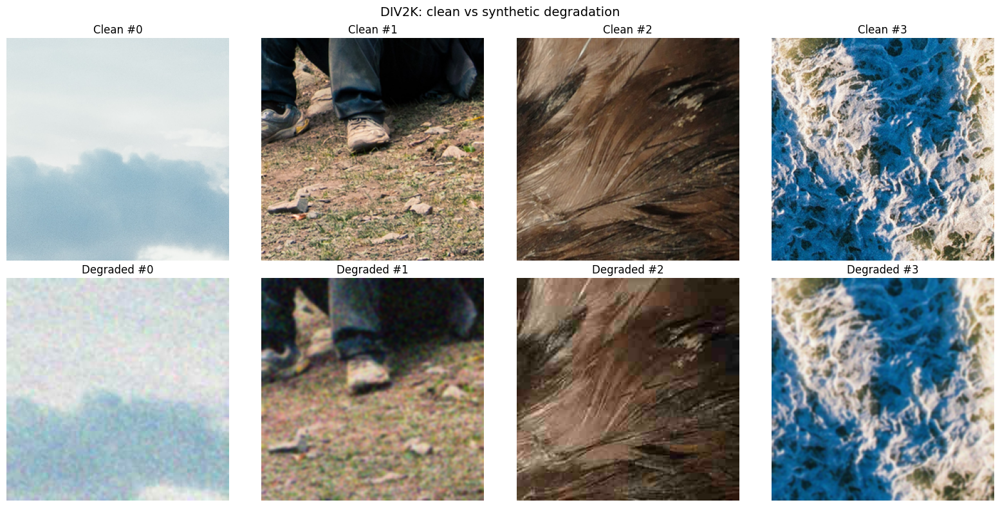

In [8]:

# ── Санітарна перевірка батчів ────────────────────────────────────────
batch_div2k = next(iter(dl_div2k_train))
batch_den   = next(iter(dl_den_train))

for name, batch in [("DIV2K degraded", batch_div2k), ("Denoising", batch_den)]:
    n  = batch["noisy"]
    c  = batch["clean"]
    print(f"{name}")
    print(f"  noisy : {tuple(n.shape)}  dtype={n.dtype}  range=[{n.min():.2f}, {n.max():.2f}]")
    print(f"  clean : {tuple(c.shape)}  dtype={c.dtype}  range=[{c.min():.2f}, {c.max():.2f}]")

# Візуалізація кількох прикладів із DIV2K
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
for i in range(4):
    noisy_np = batch_div2k["noisy"][i].permute(1, 2, 0).numpy()
    clean_np = batch_div2k["clean"][i].permute(1, 2, 0).numpy()
    axes[0, i].imshow(np.clip(clean_np, 0, 1))
    axes[0, i].set_title(f"Clean #{i}")
    axes[0, i].axis("off")
    axes[1, i].imshow(np.clip(noisy_np, 0, 1))
    axes[1, i].set_title(f"Degraded #{i}")
    axes[1, i].axis("off")
plt.suptitle("DIV2K: clean vs synthetic degradation", fontsize=14)
plt.tight_layout()
plt.show()


# Exploratory Data Analysis (EDA)

У цьому блоці зібрано повний EDA-прохід для обох наборів даних:
- Denoising Dirty Documents (реальні noisy/clean пари)
- DIV2K (чисті HR-зображення для синтетичної деградації)

,Dataset,#Images,ExampleShape,Channels,dtype,Path
0,Train (noisy),144,420x540,1,uint8,/home/invp/test/code/uni_cv/data/denoising-dir...
1,Train (clean),144,420x540,1,uint8,/home/invp/test/code/uni_cv/data/denoising-dir...
2,Test,72,258x540,1,uint8,/home/invp/test/code/uni_cv/data/denoising-dir...
3,DIV2K Train HR,800,1404x2040,3,uint8,/home/invp/test/code/uni_cv/data/div2k-dataset...
4,DIV2K Valid HR,100,1356x2040,3,uint8,/home/invp/test/code/uni_cv/data/div2k-dataset...


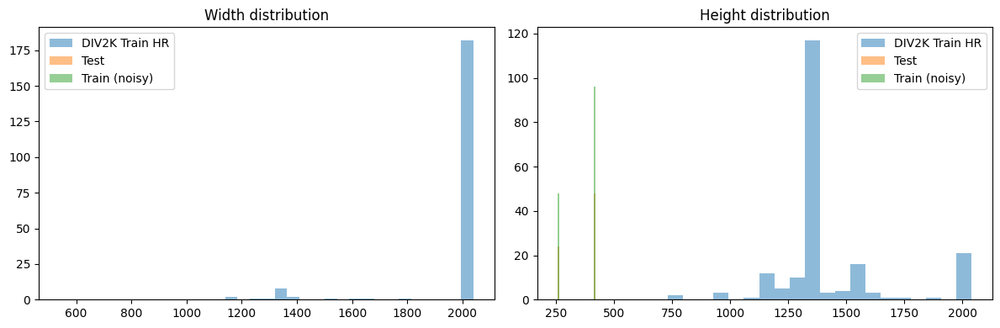

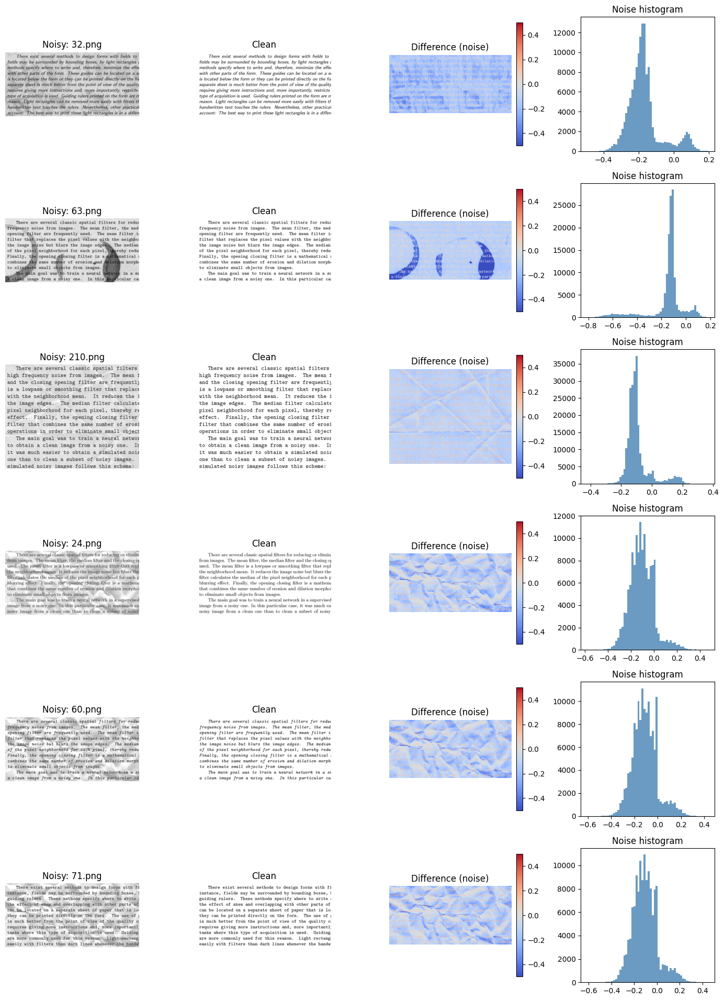

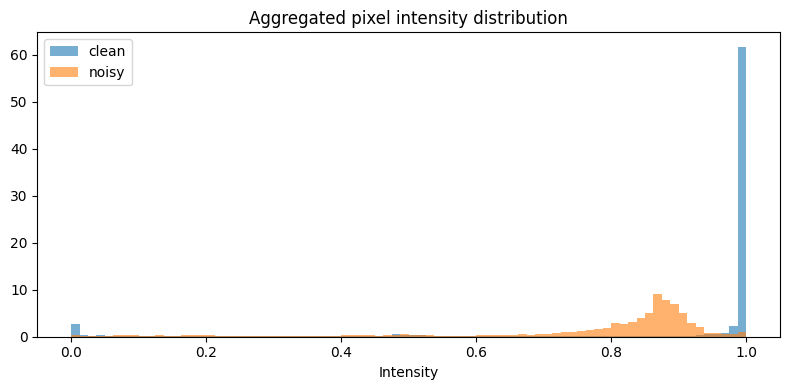

,noise_mean,noise_std,noise_abs_mean,noise_min,noise_max,noise_skew
count,144.0000,144.0000,144.0000,144.0000,144.0000,144.0000
mean,-0.1212,0.0951,0.1358,-0.5524,0.2773,0.4572
std,0.0264,0.0208,0.0220,0.1691,0.1138,1.3592
min,-0.1813,0.0642,0.1091,-0.8118,0.1490,-2.3988
25%,-0.1327,0.0759,0.1217,-0.6520,0.1804,-0.0172
50%,-0.1173,0.0960,0.1301,-0.5549,0.2333,0.7798
75%,-0.0989,0.1074,0.1431,-0.3765,0.3892,1.4485
max,-0.0863,0.1476,0.1871,-0.3098,0.4863,2.0814


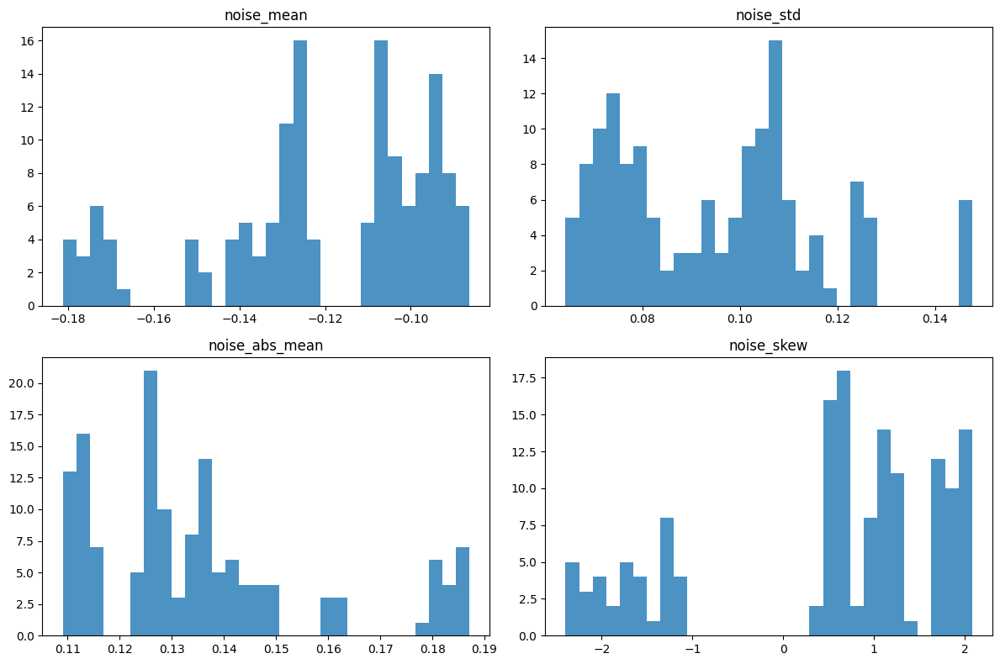

Baseline PSNR/SSIM:   0%|          | 0/144 [00:00<?, ?it/s]

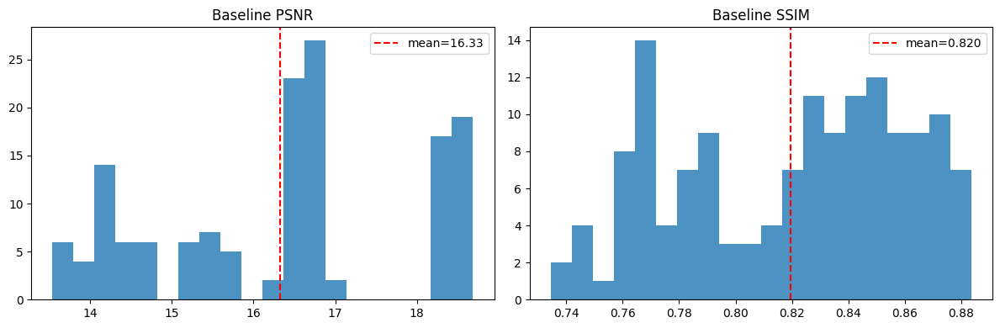

PSNR mean=16.33 dB | SSIM mean=0.8196


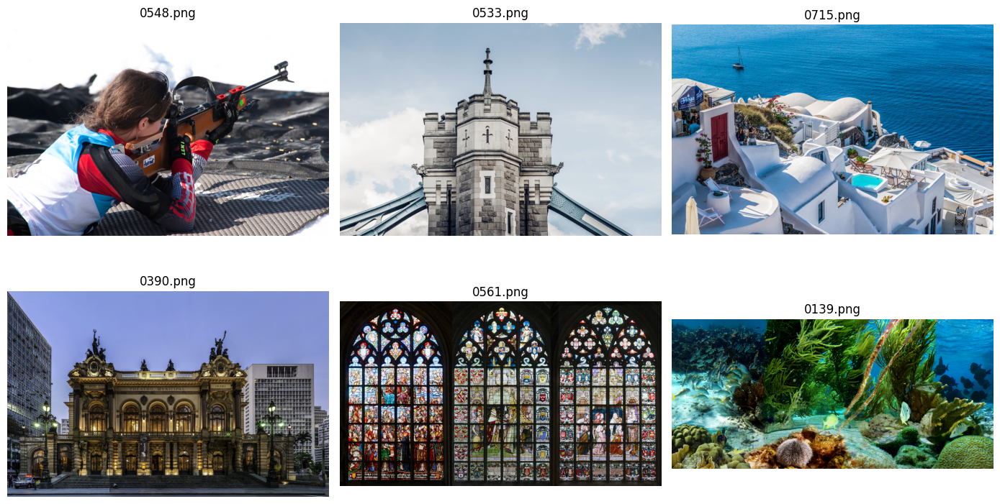

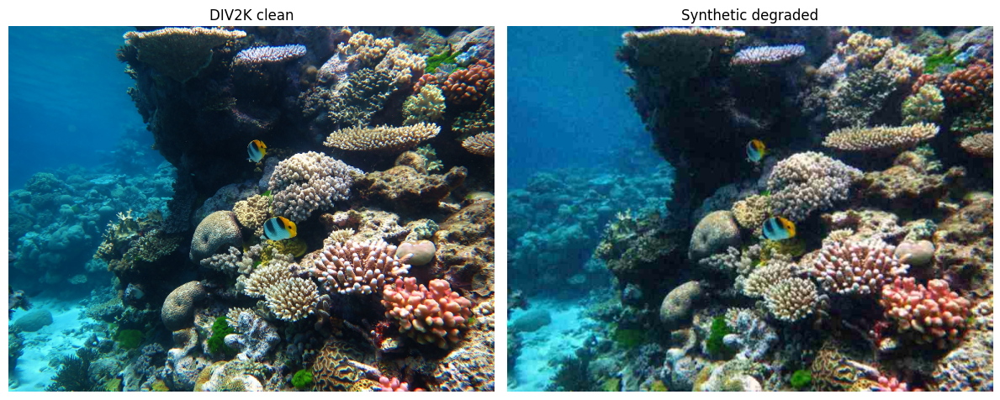

Test images: 72


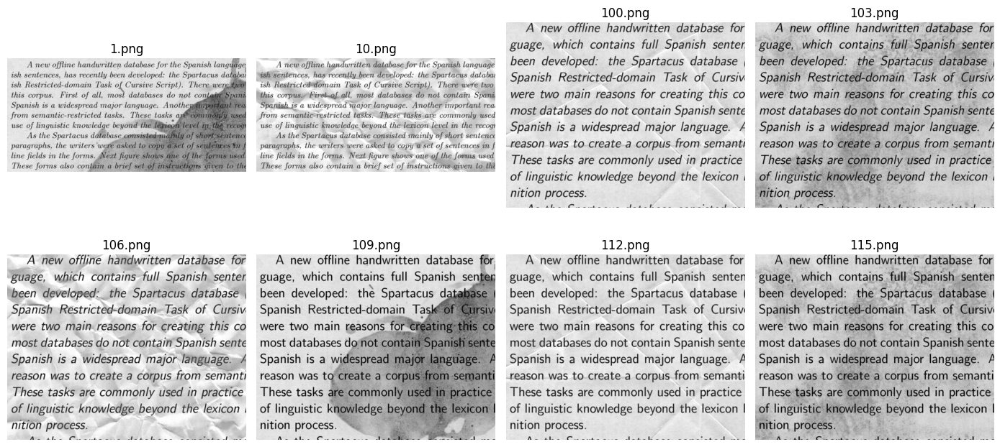

Skip submission format analysis: sampleSubmission.csv not found


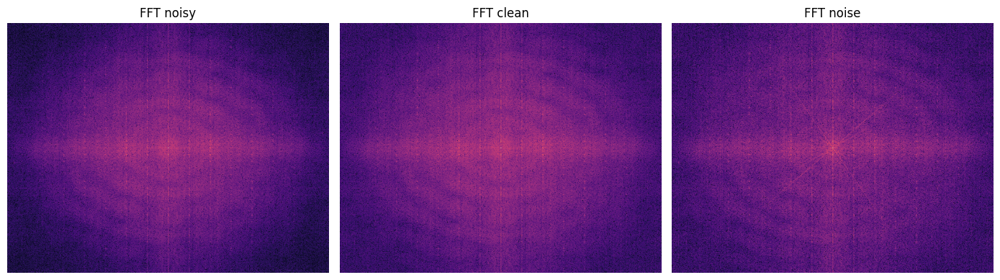

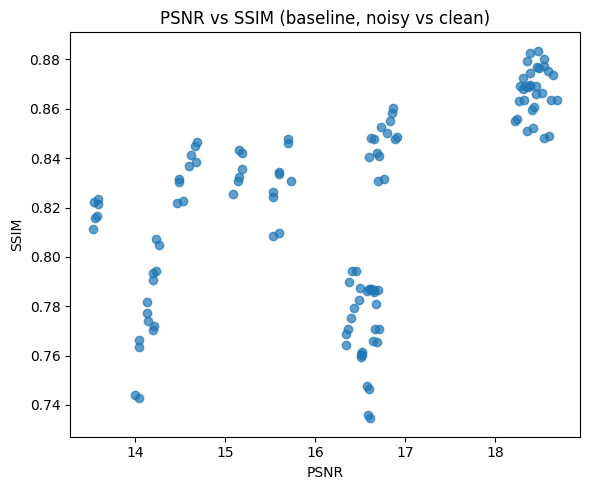

PSNR-SSIM correlation: 0.5188

EDA summary keys: ['dataset_overview', 'noise_stats', 'baseline_psnr_mean', 'baseline_ssim_mean', 'psnr_ssim_corr']


In [9]:
from skimage.metrics import peak_signal_noise_ratio as psnr_fn
from skimage.metrics import structural_similarity as ssim_fn


def list_images(path: Path, recursive: bool = False):
    if path is None or not Path(path).exists():
        return []
    iterator = Path(path).rglob("*") if recursive else Path(path).glob("*")
    return sorted([p for p in iterator if p.suffix.lower() in IMG_EXTENSIONS])


def read_gray(path: Path):
    img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    return None if img is None else (img.astype(np.float32) / 255.0)


def read_rgb(path: Path):
    img = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if img is None:
        return None
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img


eda_summary = {}

# ============================================================
# 1) Dataset structure overview
# ============================================================
datasets = {
    "Train (noisy)": DENOISING_TRAIN_DIR,
    "Train (clean)": DENOISING_CLEANED_DIR,
    "Test": DENOISING_TEST_DIR,
    "DIV2K Train HR": DIV2K_TRAIN_HR_DIR,
    "DIV2K Valid HR": DIV2K_VALID_HR_DIR,
}

rows = []
for name, p in datasets.items():
    files = list_images(p, recursive=("DIV2K" in name))
    n = len(files)
    if n == 0:
        rows.append({"Dataset": name, "#Images": 0, "ExampleShape": "-", "Channels": "-", "dtype": "-", "Path": str(p)})
        continue

    sample = cv2.imread(str(files[0]), cv2.IMREAD_UNCHANGED)
    if sample is None:
        rows.append({"Dataset": name, "#Images": n, "ExampleShape": "unreadable", "Channels": "-", "dtype": "-", "Path": str(p)})
    else:
        if sample.ndim == 2:
            shape = f"{sample.shape[0]}x{sample.shape[1]}"
            channels = 1
        else:
            shape = f"{sample.shape[0]}x{sample.shape[1]}"
            channels = sample.shape[2]
        rows.append({"Dataset": name, "#Images": n, "ExampleShape": shape, "Channels": channels, "dtype": str(sample.dtype), "Path": str(p)})


df_overview = pd.DataFrame(rows)
display(df_overview)
eda_summary["dataset_overview"] = df_overview[["Dataset", "#Images"]].to_dict("records")

# ============================================================
# 2) Image size distribution
# ============================================================
size_sources = [
    ("Train (noisy)", DENOISING_TRAIN_DIR, False),
    ("Test", DENOISING_TEST_DIR, False),
    ("DIV2K Train HR", DIV2K_TRAIN_HR_DIR, True),
]

sizes = []
for name, p, rec in size_sources:
    files = list_images(p, recursive=rec)
    take = files[: min(200, len(files))]
    for f in take:
        img = cv2.imread(str(f), cv2.IMREAD_UNCHANGED)
        if img is None:
            continue
        h, w = img.shape[:2]
        sizes.append({"Dataset": name, "W": w, "H": h})

if sizes:
    df_sizes = pd.DataFrame(sizes)
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    for name, grp in df_sizes.groupby("Dataset"):
        axes[0].hist(grp["W"], bins=20, alpha=0.5, label=name)
        axes[1].hist(grp["H"], bins=20, alpha=0.5, label=name)
    axes[0].set_title("Width distribution")
    axes[1].set_title("Height distribution")
    axes[0].legend()
    axes[1].legend()
    plt.tight_layout()
    plt.show()
else:
    print("Skip size distribution: no images available")

# ============================================================
# 3) Random noisy-clean pairs + difference
# ============================================================
noisy_files = list_images(DENOISING_TRAIN_DIR)
clean_files = list_images(DENOISING_CLEANED_DIR)
common_names = sorted(list({p.name for p in noisy_files} & {p.name for p in clean_files}))

if common_names:
    n_show = min(6, len(common_names))
    picked = random.sample(common_names, n_show)
    fig, axes = plt.subplots(n_show, 4, figsize=(14, 3.2 * n_show))
    if n_show == 1:
        axes = np.expand_dims(axes, axis=0)

    for i, name in enumerate(picked):
        noisy = read_gray(DENOISING_TRAIN_DIR / name)
        clean = read_gray(DENOISING_CLEANED_DIR / name)
        if noisy is None or clean is None:
            continue
        diff = noisy - clean

        axes[i, 0].imshow(noisy, cmap="gray", vmin=0, vmax=1)
        axes[i, 0].set_title(f"Noisy: {name}")
        axes[i, 0].axis("off")

        axes[i, 1].imshow(clean, cmap="gray", vmin=0, vmax=1)
        axes[i, 1].set_title("Clean")
        axes[i, 1].axis("off")

        im = axes[i, 2].imshow(diff, cmap="coolwarm", vmin=-0.5, vmax=0.5)
        axes[i, 2].set_title("Difference (noise)")
        axes[i, 2].axis("off")
        plt.colorbar(im, ax=axes[i, 2], fraction=0.046, pad=0.04)

        axes[i, 3].hist(diff.ravel(), bins=60, color="steelblue", alpha=0.8)
        axes[i, 3].set_title("Noise histogram")

    plt.tight_layout()
    plt.show()
else:
    print("Skip pair visualization: no common noisy-clean names")

# ============================================================
# 4) Pixel intensity distribution: noisy vs clean
# ============================================================
if common_names:
    noisy_vals = []
    clean_vals = []
    for name in common_names[: min(120, len(common_names))]:
        noisy = read_gray(DENOISING_TRAIN_DIR / name)
        clean = read_gray(DENOISING_CLEANED_DIR / name)
        if noisy is None or clean is None:
            continue
        noisy_vals.append(noisy[::4, ::4].ravel())
        clean_vals.append(clean[::4, ::4].ravel())

    if noisy_vals and clean_vals:
        noisy_vals = np.concatenate(noisy_vals)
        clean_vals = np.concatenate(clean_vals)
        plt.figure(figsize=(8, 4))
        plt.hist(clean_vals, bins=80, alpha=0.6, label="clean", density=True)
        plt.hist(noisy_vals, bins=80, alpha=0.6, label="noisy", density=True)
        plt.title("Aggregated pixel intensity distribution")
        plt.xlabel("Intensity")
        plt.legend()
        plt.tight_layout()
        plt.show()

# ============================================================
# 5) Noise stats per image
# ============================================================
if common_names:
    stats = []
    for name in common_names:
        noisy = read_gray(DENOISING_TRAIN_DIR / name)
        clean = read_gray(DENOISING_CLEANED_DIR / name)
        if noisy is None or clean is None:
            continue
        diff = noisy - clean
        stats.append({
            "noise_mean": float(diff.mean()),
            "noise_std": float(diff.std()),
            "noise_abs_mean": float(np.abs(diff).mean()),
            "noise_min": float(diff.min()),
            "noise_max": float(diff.max()),
            "noise_skew": float(pd.Series(diff.ravel()).skew()),
        })

    if stats:
        df_noise = pd.DataFrame(stats)
        display(df_noise.describe().round(4))

        fig, axes = plt.subplots(2, 2, figsize=(12, 8))
        cols = ["noise_mean", "noise_std", "noise_abs_mean", "noise_skew"]
        for ax, c in zip(axes.ravel(), cols):
            ax.hist(df_noise[c], bins=30, alpha=0.8)
            ax.set_title(c)
        plt.tight_layout()
        plt.show()
        eda_summary["noise_stats"] = df_noise.describe().to_dict()

# ============================================================
# 6) Baseline PSNR / SSIM (noisy vs clean)
# ============================================================
if common_names:
    psnrs, ssims = [], []
    for name in tqdm(common_names, desc="Baseline PSNR/SSIM"):
        noisy = read_gray(DENOISING_TRAIN_DIR / name)
        clean = read_gray(DENOISING_CLEANED_DIR / name)
        if noisy is None or clean is None:
            continue
        psnrs.append(psnr_fn(clean, noisy, data_range=1.0))
        ssims.append(ssim_fn(clean, noisy, data_range=1.0))

    if psnrs and ssims:
        psnrs = np.array(psnrs)
        ssims = np.array(ssims)
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))
        axes[0].hist(psnrs, bins=20, alpha=0.8)
        axes[0].axvline(psnrs.mean(), color="red", linestyle="--", label=f"mean={psnrs.mean():.2f}")
        axes[0].set_title("Baseline PSNR")
        axes[0].legend()

        axes[1].hist(ssims, bins=20, alpha=0.8)
        axes[1].axvline(ssims.mean(), color="red", linestyle="--", label=f"mean={ssims.mean():.3f}")
        axes[1].set_title("Baseline SSIM")
        axes[1].legend()
        plt.tight_layout()
        plt.show()

        print(f"PSNR mean={psnrs.mean():.2f} dB | SSIM mean={ssims.mean():.4f}")
        eda_summary["baseline_psnr_mean"] = float(psnrs.mean())
        eda_summary["baseline_ssim_mean"] = float(ssims.mean())

# ============================================================
# 7) DIV2K overview
# ============================================================
div2k_train_files = list_images(DIV2K_TRAIN_HR_DIR, recursive=True)
if div2k_train_files:
    sample_div = random.sample(div2k_train_files, min(6, len(div2k_train_files)))
    fig, axes = plt.subplots(2, 3, figsize=(14, 8))
    for ax, f in zip(axes.ravel(), sample_div):
        img = read_rgb(f)
        if img is not None:
            if max(img.shape[:2]) > 1200:
                scale = 1200 / max(img.shape[:2])
                img = cv2.resize(img, (int(img.shape[1] * scale), int(img.shape[0] * scale)))
            ax.imshow(img)
            ax.set_title(f.name)
        ax.axis("off")
    plt.tight_layout()
    plt.show()
else:
    print("Skip DIV2K overview: no images found")

# ============================================================
# 8) Synthetic degradation demo on DIV2K
# ============================================================
if div2k_train_files:
    img = read_rgb(random.choice(div2k_train_files))
    if img is not None:
        if max(img.shape[:2]) > 768:
            scale = 768 / max(img.shape[:2])
            img = cv2.resize(img, (int(img.shape[1] * scale), int(img.shape[0] * scale)))
        degraded = apply_degradation(img)

        plt.figure(figsize=(12, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(img)
        plt.title("DIV2K clean")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(degraded)
        plt.title("Synthetic degraded")
        plt.axis("off")
        plt.tight_layout()
        plt.show()

# ============================================================
# 9) Test set overview
# ============================================================
test_files = list_images(DENOISING_TEST_DIR)
if test_files:
    print(f"Test images: {len(test_files)}")
    preview = test_files[: min(8, len(test_files))]
    fig, axes = plt.subplots(2, 4, figsize=(14, 7))
    for ax, f in zip(axes.ravel(), preview):
        img = read_gray(f)
        if img is not None:
            ax.imshow(img, cmap="gray", vmin=0, vmax=1)
            ax.set_title(f.name)
        ax.axis("off")
    plt.tight_layout()
    plt.show()
else:
    print("Skip test overview: no test images found")

# ============================================================
# 10) Submission format analysis
# ============================================================
if DENOISING_SAMPLESUBMISSIONCSV.exists() and DENOISING_SAMPLESUBMISSIONCSV.is_file():
    df_sub_head = pd.read_csv(DENOISING_SAMPLESUBMISSIONCSV, nrows=20)
    display(df_sub_head)
    with open(DENOISING_SAMPLESUBMISSIONCSV, encoding="utf-8") as f:
        total_lines = sum(1 for _ in f) - 1
    print(f"Total submission rows (pixels): {total_lines:,}")
else:
    print("Skip submission format analysis: sampleSubmission.csv not found")

# ============================================================
# 11) FFT frequency analysis (noise spectrum)
# ============================================================
if common_names:
    name = random.choice(common_names)
    noisy = read_gray(DENOISING_TRAIN_DIR / name)
    clean = read_gray(DENOISING_CLEANED_DIR / name)
    if noisy is not None and clean is not None:
        diff = noisy - clean

        def fft_log(x):
            f = np.fft.fftshift(np.fft.fft2(x))
            return np.log1p(np.abs(f))

        noisy_f = fft_log(noisy)
        clean_f = fft_log(clean)
        noise_f = fft_log(diff)

        fig, axes = plt.subplots(1, 3, figsize=(14, 4))
        axes[0].imshow(noisy_f, cmap="magma")
        axes[0].set_title("FFT noisy")
        axes[1].imshow(clean_f, cmap="magma")
        axes[1].set_title("FFT clean")
        axes[2].imshow(noise_f, cmap="magma")
        axes[2].set_title("FFT noise")
        for ax in axes:
            ax.axis("off")
        plt.tight_layout()
        plt.show()

# ============================================================
# 12) PSNR-SSIM correlation + EDA summary
# ============================================================
if "baseline_psnr_mean" in eda_summary and common_names:
    psnrs, ssims = [], []
    eval_names = common_names[: min(120, len(common_names))]
    for name in eval_names:
        noisy = read_gray(DENOISING_TRAIN_DIR / name)
        clean = read_gray(DENOISING_CLEANED_DIR / name)
        if noisy is None or clean is None:
            continue
        psnrs.append(psnr_fn(clean, noisy, data_range=1.0))
        ssims.append(ssim_fn(clean, noisy, data_range=1.0))

    if psnrs and ssims:
        psnrs = np.array(psnrs)
        ssims = np.array(ssims)
        plt.figure(figsize=(6, 5))
        plt.scatter(psnrs, ssims, alpha=0.7)
        plt.xlabel("PSNR")
        plt.ylabel("SSIM")
        plt.title("PSNR vs SSIM (baseline, noisy vs clean)")
        plt.tight_layout()
        plt.show()

        corr = float(np.corrcoef(psnrs, ssims)[0, 1])
        eda_summary["psnr_ssim_corr"] = corr
        print(f"PSNR-SSIM correlation: {corr:.4f}")

print("\nEDA summary keys:", list(eda_summary.keys()))

# Models: CDAE, DnCNN, U-Net

Нижче — компактні реалізації трьох моделей у єдиному стилі інтерфейсу для спільного train/eval циклу.

In [10]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)


class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.net(x)


class CDAE(nn.Module):
    def __init__(self, in_ch=1, base=32):
        super().__init__()
        self.enc1 = ConvBlock(in_ch, base)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = ConvBlock(base, base * 2)
        self.pool2 = nn.MaxPool2d(2)

        self.bottleneck = ConvBlock(base * 2, base * 4)

        self.up2 = nn.ConvTranspose2d(base * 4, base * 2, 2, stride=2)
        self.dec2 = ConvBlock(base * 2, base * 2)
        self.up1 = nn.ConvTranspose2d(base * 2, base, 2, stride=2)
        self.dec1 = ConvBlock(base, base)
        self.out = nn.Conv2d(base, in_ch, 1)

        # Residual head starts from identity behavior.
        nn.init.zeros_(self.out.weight)
        nn.init.zeros_(self.out.bias)

    def forward(self, x):
        inp = x
        x1 = self.enc1(x)
        x2 = self.enc2(self.pool1(x1))
        xb = self.bottleneck(self.pool2(x2))
        x = self.dec2(self.up2(xb))
        x = self.dec1(self.up1(x))
        return inp + self.out(x)  # no clamp in train forward


class DnCNN(nn.Module):
    def __init__(self, in_ch=1, depth=8, width=64):
        super().__init__()
        layers = [nn.Conv2d(in_ch, width, 3, padding=1), nn.ReLU(inplace=True)]
        for _ in range(depth - 2):
            layers += [
                nn.Conv2d(width, width, 3, padding=1),
                nn.BatchNorm2d(width),
                nn.ReLU(inplace=True),
            ]
        layers += [nn.Conv2d(width, in_ch, 3, padding=1)]
        self.net = nn.Sequential(*layers)

    def forward(self, x):
        pred_noise = self.net(x)
        return x - pred_noise  # no clamp in train forward


class UNetSmall(nn.Module):
    def __init__(self, in_ch=1, base=32):
        super().__init__()
        self.enc1 = ConvBlock(in_ch, base)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = ConvBlock(base, base * 2)
        self.pool2 = nn.MaxPool2d(2)

        self.bridge = ConvBlock(base * 2, base * 4)

        self.up2 = nn.ConvTranspose2d(base * 4, base * 2, 2, stride=2)
        self.dec2 = ConvBlock(base * 4, base * 2)
        self.up1 = nn.ConvTranspose2d(base * 2, base, 2, stride=2)
        self.dec1 = ConvBlock(base * 2, base)
        self.out = nn.Conv2d(base, in_ch, 1)

        # Residual head starts from identity behavior.
        nn.init.zeros_(self.out.weight)
        nn.init.zeros_(self.out.bias)

    def forward(self, x):
        inp = x

        x1 = self.enc1(x)
        x2 = self.enc2(self.pool1(x1))
        xb = self.bridge(self.pool2(x2))

        x = self.up2(xb)
        x = torch.cat([x, x2], dim=1)
        x = self.dec2(x)

        x = self.up1(x)
        x = torch.cat([x, x1], dim=1)
        x = self.dec1(x)

        return inp + self.out(x)  # no clamp in train forward


def build_model(model_name: str, in_channels: int = 1):
    key = model_name.lower()
    if key == "cdae":
        return CDAE(in_ch=in_channels)
    if key == "dncnn":
        return DnCNN(in_ch=in_channels)
    if key == "unet":
        return UNetSmall(in_ch=in_channels)
    raise ValueError(f"Unknown model: {model_name}")

In [11]:

# Unified training / validation API with checkpointing and tqdm progress bars
CHECKPOINT_ROOT = ROOT_DIR / "checkpoints"
CHECKPOINT_ROOT.mkdir(parents=True, exist_ok=True)


def _clamp01(x: torch.Tensor):
    return torch.clamp(x, 0.0, 1.0)


def psnr_torch(pred: torch.Tensor, target: torch.Tensor, eps: float = 1e-8):
    pred = _clamp01(pred)
    target = _clamp01(target)
    mse = torch.mean((pred - target) ** 2, dim=(1, 2, 3))
    psnr = 10.0 * torch.log10(1.0 / (mse + eps))
    return psnr.mean().item()


def ssim_batch(pred: torch.Tensor, target: torch.Tensor, max_items: int = 4):
    pred_np = _clamp01(pred).detach().cpu().numpy()
    target_np = _clamp01(target).detach().cpu().numpy()
    n = min(max_items, pred_np.shape[0])

    vals = []
    for i in range(n):
        vals.append(
            ssim_fn(
                target_np[i, 0],
                pred_np[i, 0],
                data_range=1.0,
            )
        )
    return float(np.mean(vals)) if vals else float("nan")


@torch.no_grad()
def validate_one_epoch(model, loader, criterion, device, verbose=True):
    model.eval()
    total_loss, total_psnr, total_ssim = 0.0, 0.0, 0.0
    steps = 0

    pbar = tqdm(loader, desc="    val", leave=False) if verbose else loader
    for batch in pbar:
        noisy = batch["noisy"].to(device)
        clean = batch["clean"].to(device)

        pred_raw = model(noisy)
        pred = _clamp01(pred_raw)
        loss = criterion(pred, clean)

        total_loss += loss.item()
        total_psnr += psnr_torch(pred, clean)
        total_ssim += ssim_batch(pred, clean)
        steps += 1

        if verbose and hasattr(pbar, "set_postfix") and steps > 0:
            pbar.set_postfix(loss=f"{total_loss/steps:.4f}")

    if steps == 0:
        return {"loss": float("nan"), "psnr": float("nan"), "ssim": float("nan")}

    return {
        "loss": total_loss / steps,
        "psnr": total_psnr / steps,
        "ssim": total_ssim / steps,
    }


def train_one_epoch(model, loader, criterion, optimizer, device, max_grad_norm=5.0, verbose=True):
    model.train()
    total_loss, total_psnr = 0.0, 0.0
    steps = 0

    pbar = tqdm(loader, desc="  train", leave=False) if verbose else loader
    for batch in pbar:
        noisy = batch["noisy"].to(device)
        clean = batch["clean"].to(device)

        optimizer.zero_grad(set_to_none=True)

        pred_raw = model(noisy)
        pred = _clamp01(pred_raw)
        loss = criterion(pred, clean)

        if not torch.isfinite(loss):
            continue

        loss.backward()
        clip_grad_norm_(model.parameters(), max_grad_norm)
        optimizer.step()

        total_loss += loss.item()
        total_psnr += psnr_torch(pred.detach(), clean)
        steps += 1

        if verbose and hasattr(pbar, "set_postfix") and steps > 0:
            pbar.set_postfix(loss=f"{total_loss/steps:.4f}", psnr=f"{total_psnr/steps:.2f}")

    if steps == 0:
        return {"loss": float("nan"), "psnr": float("nan")}

    return {
        "loss": total_loss / steps,
        "psnr": total_psnr / steps,
    }


def run_training(
    model_name,
    train_loader,
    val_loader,
    in_channels=1,
    epochs=30,
    lr=3e-4,
    patience=8,
    verbose=True,
):
    model = build_model(model_name, in_channels=in_channels).to(device)

    criterion = nn.SmoothL1Loss(beta=0.05)
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="min",
        factor=0.5,
        patience=2,
    )

    model_dir = CHECKPOINT_ROOT / model_name.lower()
    model_dir.mkdir(parents=True, exist_ok=True)
    best_path = model_dir / "best.pt"

    history = []
    best_val = float("inf")
    bad_epochs = 0

    epoch_pbar = (
        tqdm(range(1, epochs + 1), desc=f"[{model_name}]", unit="ep")
        if verbose
        else range(1, epochs + 1)
    )

    for epoch in epoch_pbar:
        tr = train_one_epoch(model, train_loader, criterion, optimizer, device, verbose=verbose)
        va = validate_one_epoch(model, val_loader, criterion, device, verbose=verbose)

        if np.isfinite(va["loss"]):
            scheduler.step(va["loss"])

        row = {
            "epoch": epoch,
            "lr": optimizer.param_groups[0]["lr"],
            "train_loss": tr["loss"],
            "train_psnr": tr["psnr"],
            "val_loss": va["loss"],
            "val_psnr": va["psnr"],
            "val_ssim": va["ssim"],
        }
        history.append(row)

        if verbose and hasattr(epoch_pbar, "set_postfix"):
            epoch_pbar.set_postfix(
                tr_l=f"{tr['loss']:.4f}",
                va_l=f"{va['loss']:.4f}",
                psnr=f"{va['psnr']:.2f}",
                ssim=f"{va['ssim']:.4f}",
                lr=f"{optimizer.param_groups[0]['lr']:.1e}",
            )

        if np.isfinite(va["loss"]) and va["loss"] < best_val:
            best_val = va["loss"]
            bad_epochs = 0
            torch.save(
                {
                    "model_name": model_name,
                    "state_dict": model.state_dict(),
                    "in_channels": in_channels,
                    "best_val_loss": best_val,
                    "history": history,
                },
                best_path,
            )
        else:
            bad_epochs += 1
            if bad_epochs >= patience:
                if verbose:
                    tqdm.write(f"Early stopping for {model_name} (patience={patience})")
                break

    return {
        "model_name": model_name,
        "model": model,
        "history": pd.DataFrame(history),
        "best_path": best_path,
        "best_val_loss": best_val,
    }


# Optuna HPO + Final Training (CDAE, DnCNN, U-Net)

**Пайплайн:**
1. **Optuna HPO** — для кожної моделі запускається пошук гіперпараметрів (lr, weight_decay, smooth_l1_beta, архітектурні параметри) з pruning безперспективних trials.
2. **Фінальне навчання** — модель тренується з найкращими знайденими параметрами на повну кількість епох з early stopping.
3. Чекпоінт `best.pt` зберігає і `state_dict`, і знайдені `best_params` для відтворюваності.


  Optuna HPO: [cdae]  (15 trials × 5 ep)


  0%|          | 0/15 [00:00<?, ?it/s]

  Best val_loss = 0.010390
    lr: 0.0005940246532927061
    weight_decay: 3.780009544740881e-05
    smooth_l1_beta: 0.19661961304897504
    sched_patience: 2
    sched_factor: 0.664700243743102
    base: 64


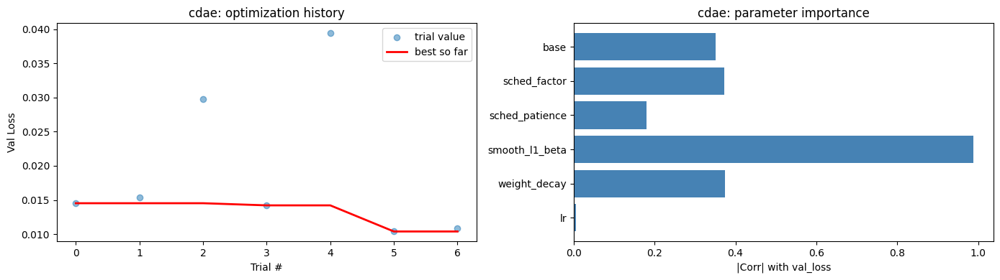


  Optuna HPO: [dncnn]  (15 trials × 5 ep)


  0%|          | 0/15 [00:00<?, ?it/s]

  Best val_loss = 0.011337
    lr: 5.785158116903978e-05
    weight_decay: 0.00013540400918261934
    smooth_l1_beta: 0.13747048834032355
    sched_patience: 5
    sched_factor: 0.5477715305169609
    depth: 10
    width: 128


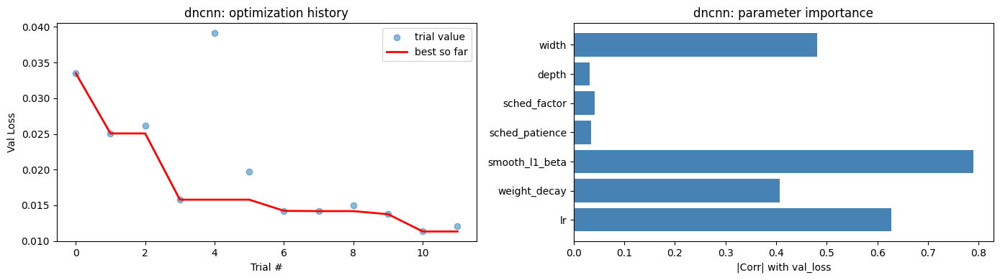


  Optuna HPO: [unet]  (15 trials × 5 ep)


  0%|          | 0/15 [00:00<?, ?it/s]

  Best val_loss = 0.010777
    lr: 0.0008234734193773729
    weight_decay: 0.00027420616199071396
    smooth_l1_beta: 0.17239870641591443
    sched_patience: 2
    sched_factor: 0.5813810282314915
    base: 64


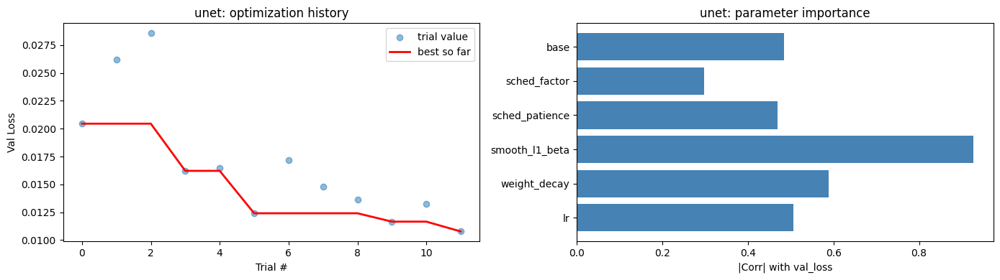


  Optuna: best hyperparameters per model


,model,lr,weight_decay,smooth_l1_beta,sched_patience,sched_factor,base,depth,width
0,cdae,0.000594,0.000038,0.196620,2,0.664700,64.0,NaN,NaN
1,dncnn,0.000058,0.000135,0.137470,5,0.547772,NaN,10.0,128.0
2,unet,0.000823,0.000274,0.172399,2,0.581381,64.0,NaN,NaN



  Final training: [cdae] — 30 epochs
  Params: {'lr': 0.0005940246532927061, 'weight_decay': 3.780009544740881e-05, 'smooth_l1_beta': 0.19661961304897504, 'sched_patience': 2, 'sched_factor': 0.664700243743102, 'base': 64}


[cdae] final:   0%|          | 0/30 [00:00<?, ?ep/s]

In [ ]:
import optuna
from functools import partial

optuna.logging.set_verbosity(optuna.logging.WARNING)

# ══════════════════════════════════════════════════════════════════════
# Конфігурація
# ══════════════════════════════════════════════════════════════════════
MODEL_LIST      = ["cdae", "dncnn", "unet"]
OPTUNA_TRIALS   = 15          # кількість trials на модель
OPTUNA_EPOCHS   = 5           # короткий прогін для оцінки trial
FINAL_EPOCHS    = 30          # фінальне навчання з найкращими параметрами
FINAL_PATIENCE  = 10          # early stopping patience

train_loader = dl_combined_train
val_loader   = dl_combined_val
in_channels  = 1


# ══════════════════════════════════════════════════════════════════════
# Optuna objective
# ══════════════════════════════════════════════════════════════════════
def optuna_objective(trial, model_name, train_loader, val_loader, in_channels=1, max_epochs=5):
    """Optuna objective: навчити модель зі сімплованими гіперпараметрами, повернути best val_loss."""

    # ── Гіперпараметри оптимізатора ──
    lr            = trial.suggest_float("lr", 1e-5, 3e-3, log=True)
    weight_decay  = trial.suggest_float("weight_decay", 1e-6, 1e-3, log=True)
    beta          = trial.suggest_float("smooth_l1_beta", 0.01, 0.2)
    sched_patience = trial.suggest_int("sched_patience", 2, 5)
    sched_factor  = trial.suggest_float("sched_factor", 0.3, 0.7)

    # ── Архітектурні параметри ──
    if model_name == "dncnn":
        depth = trial.suggest_int("depth", 4, 17)
        width = trial.suggest_categorical("width", [32, 64, 128])
        model = DnCNN(in_ch=in_channels, depth=depth, width=width).to(device)
    elif model_name == "cdae":
        base = trial.suggest_categorical("base", [16, 32, 64])
        model = CDAE(in_ch=in_channels, base=base).to(device)
    else:  # unet
        base = trial.suggest_categorical("base", [16, 32, 64])
        model = UNetSmall(in_ch=in_channels, base=base).to(device)

    criterion = nn.SmoothL1Loss(beta=beta)
    optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="min", factor=sched_factor, patience=sched_patience,
    )

    best_val_loss = float("inf")

    for epoch in range(1, max_epochs + 1):
        train_one_epoch(model, train_loader, criterion, optimizer, device, verbose=False)
        va = validate_one_epoch(model, val_loader, criterion, device, verbose=False)

        if np.isfinite(va["loss"]):
            scheduler.step(va["loss"])
            best_val_loss = min(best_val_loss, va["loss"])

        # Pruning: відкидаємо безнадійні trials рано
        trial.report(va["loss"], epoch)
        if trial.should_prune():
            raise optuna.TrialPruned()

    return best_val_loss


# ══════════════════════════════════════════════════════════════════════
# 1) Optuna HPO для кожної моделі
# ══════════════════════════════════════════════════════════════════════
best_params_all = {}

for model_name in MODEL_LIST:
    print(f"\n{'='*60}")
    print(f"  Optuna HPO: [{model_name}]  ({OPTUNA_TRIALS} trials × {OPTUNA_EPOCHS} ep)")
    print(f"{'='*60}")

    study = optuna.create_study(
        direction="minimize",
        pruner=optuna.pruners.MedianPruner(n_warmup_steps=2),
        study_name=f"{model_name}_tuning",
    )

    study.optimize(
        partial(
            optuna_objective,
            model_name=model_name,
            train_loader=train_loader,
            val_loader=val_loader,
            in_channels=in_channels,
            max_epochs=OPTUNA_EPOCHS,
        ),
        n_trials=OPTUNA_TRIALS,
        timeout=1800,
        show_progress_bar=True,
    )

    bp = study.best_params
    best_params_all[model_name] = bp
    print(f"  Best val_loss = {study.best_value:.6f}")
    for k, v in bp.items():
        print(f"    {k}: {v}")

    # ── Візуалізація Optuna ──
    completed = [t for t in study.trials if t.state == optuna.trial.TrialState.COMPLETE]
    vals = [t.value for t in completed]
    if vals:
        fig, axes = plt.subplots(1, 2, figsize=(14, 4))

        best_so_far = np.minimum.accumulate(vals)
        axes[0].scatter(range(len(vals)), vals, alpha=0.5, label="trial value")
        axes[0].plot(best_so_far, color="red", linewidth=2, label="best so far")
        axes[0].set_xlabel("Trial #")
        axes[0].set_ylabel("Val Loss")
        axes[0].set_title(f"{model_name}: optimization history")
        axes[0].legend()

        param_names = list(bp.keys())
        importances = []
        for p in param_names:
            p_vals, o_vals = [], []
            for t in completed:
                if p in t.params and isinstance(t.params[p], (int, float)):
                    p_vals.append(t.params[p])
                    o_vals.append(t.value)
            if len(p_vals) > 2:
                c = abs(float(np.corrcoef(p_vals, o_vals)[0, 1]))
                importances.append(c if np.isfinite(c) else 0.0)
            else:
                importances.append(0.0)

        axes[1].barh(param_names, importances, color="steelblue")
        axes[1].set_xlabel("|Corr| with val_loss")
        axes[1].set_title(f"{model_name}: parameter importance")
        plt.tight_layout()
        plt.show()

# Зведена таблиця Optuna
optuna_rows = []
for name, params in best_params_all.items():
    row = {"model": name}
    row.update(params)
    optuna_rows.append(row)
df_optuna = pd.DataFrame(optuna_rows)
print("\n" + "="*60)
print("  Optuna: best hyperparameters per model")
print("="*60)
display(df_optuna)


# ══════════════════════════════════════════════════════════════════════
# 2) Фінальне навчання з найкращими параметрами
# ══════════════════════════════════════════════════════════════════════
results = {}
summary_rows = []

for model_name in MODEL_LIST:
    bp = best_params_all[model_name]
    print(f"\n{'='*60}")
    print(f"  Final training: [{model_name}] — {FINAL_EPOCHS} epochs")
    print(f"  Params: {bp}")
    print(f"{'='*60}")

    # ── Побудова моделі з найкращою архітектурою ──
    if model_name == "dncnn":
        final_model = DnCNN(
            in_ch=in_channels,
            depth=bp.get("depth", 8),
            width=bp.get("width", 64),
        ).to(device)
    elif model_name == "cdae":
        final_model = CDAE(in_ch=in_channels, base=bp.get("base", 32)).to(device)
    else:
        final_model = UNetSmall(in_ch=in_channels, base=bp.get("base", 32)).to(device)

    criterion = nn.SmoothL1Loss(beta=bp.get("smooth_l1_beta", 0.05))
    optimizer = torch.optim.AdamW(
        final_model.parameters(),
        lr=bp["lr"],
        weight_decay=bp.get("weight_decay", 1e-5),
    )
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="min",
        factor=bp.get("sched_factor", 0.5),
        patience=bp.get("sched_patience", 3),
    )

    model_dir = CHECKPOINT_ROOT / model_name.lower()
    model_dir.mkdir(parents=True, exist_ok=True)
    best_path = model_dir / "best.pt"

    history = []
    best_val = float("inf")
    bad_epochs = 0

    epoch_pbar = tqdm(range(1, FINAL_EPOCHS + 1), desc=f"[{model_name}] final", unit="ep")
    for epoch in epoch_pbar:
        tr = train_one_epoch(final_model, train_loader, criterion, optimizer, device, verbose=False)
        va = validate_one_epoch(final_model, val_loader, criterion, device, verbose=False)

        if np.isfinite(va["loss"]):
            scheduler.step(va["loss"])

        row = {
            "epoch": epoch,
            "lr": optimizer.param_groups[0]["lr"],
            "train_loss": tr["loss"],
            "train_psnr": tr["psnr"],
            "val_loss": va["loss"],
            "val_psnr": va["psnr"],
            "val_ssim": va["ssim"],
        }
        history.append(row)

        epoch_pbar.set_postfix(
            tr_l=f"{tr['loss']:.4f}",
            va_l=f"{va['loss']:.4f}",
            psnr=f"{va['psnr']:.2f}",
            ssim=f"{va['ssim']:.4f}",
            lr=f"{optimizer.param_groups[0]['lr']:.1e}",
        )

        if np.isfinite(va["loss"]) and va["loss"] < best_val:
            best_val = va["loss"]
            bad_epochs = 0
            torch.save(
                {
                    "model_name": model_name,
                    "state_dict": final_model.state_dict(),
                    "in_channels": in_channels,
                    "best_val_loss": best_val,
                    "best_params": bp,
                    "history": history,
                },
                best_path,
            )
        else:
            bad_epochs += 1
            if bad_epochs >= FINAL_PATIENCE:
                tqdm.write(f"  Early stopping for {model_name} at epoch {epoch}")
                break

    h = pd.DataFrame(history)
    results[model_name] = {
        "model": final_model,
        "history": h,
        "best_path": best_path,
        "best_val_loss": best_val,
    }

    if not h.empty and h["val_loss"].notna().any():
        best_row = h.loc[h["val_loss"].idxmin()]
        summary_rows.append(
            {
                "model": model_name,
                "best_epoch": int(best_row["epoch"]),
                "best_val_loss": float(best_row["val_loss"]),
                "best_val_psnr": float(best_row["val_psnr"]),
                "best_val_ssim": float(best_row["val_ssim"]),
                "optuna_params": str(bp),
                "checkpoint": str(best_path),
            }
        )

# ══════════════════════════════════════════════════════════════════════
# 3) Підсумки
# ══════════════════════════════════════════════════════════════════════
df_train_summary = pd.DataFrame(summary_rows).sort_values("best_val_loss")
print("\n" + "="*60)
print("  Final training summary")
print("="*60)
display(df_train_summary)

# Графіки
if results:
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    for m, out in results.items():
        h = out["history"]
        if not h.empty:
            axes[0].plot(h["epoch"], h["val_loss"], marker="o", label=m)
            axes[1].plot(h["epoch"], h["val_psnr"], marker="o", label=m)
            axes[2].plot(h["epoch"], h["val_ssim"], marker="o", label=m)
    axes[0].set(xlabel="Epoch", ylabel="Val Loss", title="Validation Loss")
    axes[1].set(xlabel="Epoch", ylabel="Val PSNR (dB)", title="Validation PSNR")
    axes[2].set(xlabel="Epoch", ylabel="Val SSIM", title="Validation SSIM")
    for ax in axes:
        ax.legend()
        ax.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

# Inference and qualitative comparison

Завантажуємо `best.pt` для кожної моделі, рахуємо PSNR/SSIM на одному batch валідації та показуємо `noisy / prediction / clean`.

Loaded cdae from /home/invp/test/code/uni_cv/checkpoints/cdae/best.pt
Loaded dncnn from /home/invp/test/code/uni_cv/checkpoints/dncnn/best.pt
Loaded unet from /home/invp/test/code/uni_cv/checkpoints/unet/best.pt

  Denoising Documents — metrics


,model,batch_psnr,batch_ssim
2,unet,26.009613,0.963171
0,cdae,22.651134,0.949873
1,dncnn,22.154415,0.853076


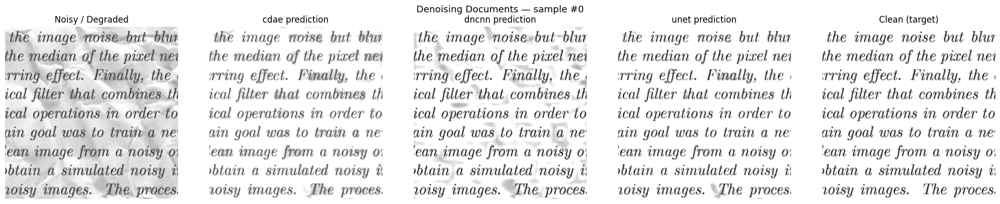

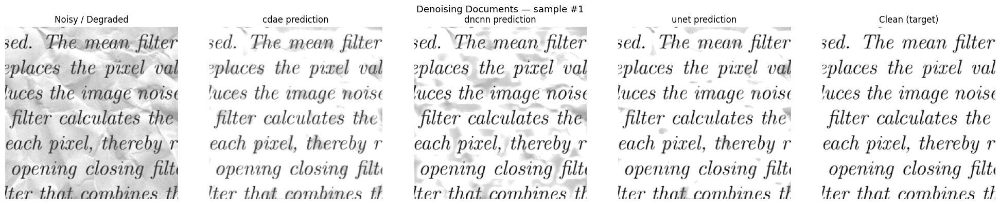


  DIV2K (grayscale, synthetic degradation) — metrics


,model,batch_psnr,batch_ssim
1,dncnn,26.498871,0.655013
2,unet,26.263910,0.646302
0,cdae,26.121859,0.621117


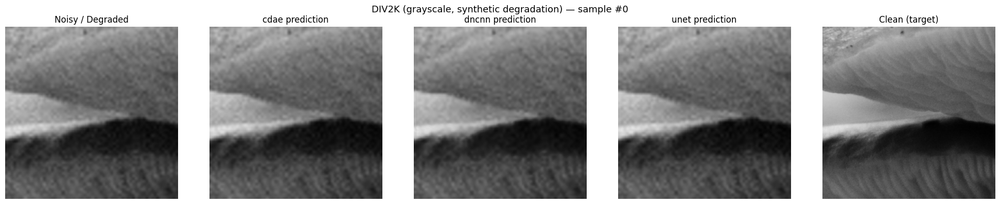

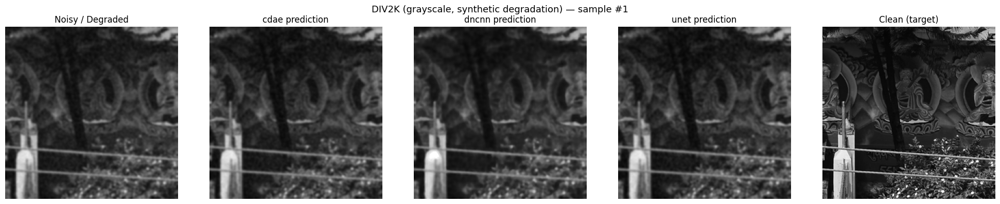


  Combined comparison


,model,batch_psnr,batch_ssim,dataset
3,dncnn,26.498871,0.655013,DIV2K gray
4,unet,26.263910,0.646302,DIV2K gray
5,cdae,26.121859,0.621117,DIV2K gray
0,unet,26.009613,0.963171,Denoising Docs
1,cdae,22.651134,0.949873,Denoising Docs
2,dncnn,22.154415,0.853076,Denoising Docs


In [25]:
@torch.no_grad()
def load_best_model(model_name: str, in_channels: int = 1, map_location=device):
    path = CHECKPOINT_ROOT / model_name.lower() / "best.pt"
    if not path.exists():
        raise FileNotFoundError(f"Checkpoint not found: {path}")
    payload = torch.load(path, map_location=map_location)
    model = build_model(model_name, in_channels=in_channels).to(device)
    model.load_state_dict(payload["state_dict"])
    model.eval()
    return model, path


@torch.no_grad()
def evaluate_batch(model, batch):
    noisy = batch["noisy"].to(device)
    clean = batch["clean"].to(device)
    pred = model(noisy)
    return {
        "pred": pred,
        "psnr": psnr_torch(pred, clean),
        "ssim": ssim_batch(pred, clean, max_items=min(8, noisy.shape[0])),
    }


def _run_comparison(batch, models_dict, title_prefix="", is_gray=True):
    """Evaluate all models on a batch and show visual comparison."""
    compare_rows = []
    model_preds = {}

    for model_name, model in models_dict.items():
        out = evaluate_batch(model, batch)
        model_preds[model_name] = out["pred"].cpu()
        compare_rows.append(
            {
                "model": model_name,
                "batch_psnr": out["psnr"],
                "batch_ssim": out["ssim"],
            }
        )

    df = pd.DataFrame(compare_rows).sort_values("batch_psnr", ascending=False)
    print(f"\n{'='*50}")
    print(f"  {title_prefix} — metrics")
    print(f"{'='*50}")
    display(df)

    # Visual comparison for several samples
    n_vis = min(3, len(models_dict))
    model_names = list(models_dict.keys())[:n_vis]
    n_samples = min(2, batch["noisy"].shape[0])

    for sample_idx in range(n_samples):
        ncols = 2 + n_vis
        fig, axes = plt.subplots(1, ncols, figsize=(4 * ncols, 4))

        if is_gray:
            noisy_np = batch["noisy"][sample_idx, 0].cpu().numpy()
            clean_np = batch["clean"][sample_idx, 0].cpu().numpy()
            axes[0].imshow(noisy_np, cmap="gray", vmin=0, vmax=1)
            for i, mn in enumerate(model_names, start=1):
                pred_np = model_preds[mn][sample_idx, 0].numpy()
                axes[i].imshow(pred_np, cmap="gray", vmin=0, vmax=1)
                axes[i].set_title(f"{mn} prediction")
                axes[i].axis("off")
            axes[-1].imshow(clean_np, cmap="gray", vmin=0, vmax=1)
        else:
            noisy_np = batch["noisy"][sample_idx].permute(1, 2, 0).cpu().numpy()
            clean_np = batch["clean"][sample_idx].permute(1, 2, 0).cpu().numpy()
            axes[0].imshow(np.clip(noisy_np, 0, 1))
            for i, mn in enumerate(model_names, start=1):
                pred_np = model_preds[mn][sample_idx].permute(1, 2, 0).numpy()
                axes[i].imshow(np.clip(pred_np, 0, 1))
                axes[i].set_title(f"{mn} prediction")
                axes[i].axis("off")
            axes[-1].imshow(np.clip(clean_np, 0, 1))

        axes[0].set_title("Noisy / Degraded")
        axes[0].axis("off")
        axes[-1].set_title("Clean (target)")
        axes[-1].axis("off")

        fig.suptitle(f"{title_prefix} — sample #{sample_idx}", fontsize=13)
        plt.tight_layout()
        plt.show()

    return df


# ── Load all models once ─────────────────────────────────────────────
loaded_models = {}
for model_name in MODEL_LIST:
    model, ckpt_path = load_best_model(model_name, in_channels=1)
    loaded_models[model_name] = model
    print(f"Loaded {model_name} from {ckpt_path}")


# ══════════════════════════════════════════════════════════════════════
# 1) Denoising Documents comparison
# ══════════════════════════════════════════════════════════════════════
val_batch_den = next(iter(dl_den_val))
df_den = _run_comparison(
    val_batch_den, loaded_models,
    title_prefix="Denoising Documents", is_gray=True,
)

# ══════════════════════════════════════════════════════════════════════
# 2) DIV2K (grayscale synthetic degradation) comparison
# ══════════════════════════════════════════════════════════════════════
_dl_div2k_val_gray = make_loader(ds_div2k_val_gray, shuffle=False, drop_last=False)
val_batch_div2k = next(iter(_dl_div2k_val_gray))
df_div2k = _run_comparison(
    val_batch_div2k, loaded_models,
    title_prefix="DIV2K (grayscale, synthetic degradation)", is_gray=True,
)

# ══════════════════════════════════════════════════════════════════════
# Combined summary table
# ══════════════════════════════════════════════════════════════════════
df_den["dataset"] = "Denoising Docs"
df_div2k["dataset"] = "DIV2K gray"
df_all = pd.concat([df_den, df_div2k], ignore_index=True)
print("\n" + "="*50)
print("  Combined comparison")
print("="*50)
display(df_all.sort_values(["dataset", "batch_psnr"], ascending=[True, False]))

# Run order and reproducibility checklist

Рекомендований порядок запуску:
1. Imports + device check
2. Archive extraction and folder normalization
3. Dataset constants + dataset classes
4. DataLoader creation
5. `one_batch_smoke_test()`
6. EDA block
7. Models definitions
8. Train API
9. Sequential training (`cdae`, `dncnn`, `unet`)
10. Inference comparison

Критерії готовності:
- DataLoader не падає в notebook-режимі
- EDA секції відпрацьовують (або коректно `Skip` при відсутніх файлах)
- Є `best.pt` для кожної моделі
- Є таблиці порівняння по val метриках і візуальні приклади

In [21]:
def one_batch_smoke_test(loaders: dict):
    """Quick validation for loader output structure and tensor ranges."""
    for name, loader in loaders.items():
        batch = next(iter(loader))
        assert "noisy" in batch and "clean" in batch, f"Missing keys in {name} batch"

        noisy = batch["noisy"]
        clean = batch["clean"]
        assert noisy.ndim == 4 and clean.ndim == 4, f"Expected BCHW tensors in {name}"
        assert noisy.shape == clean.shape, f"Shape mismatch in {name}: {noisy.shape} vs {clean.shape}"
        assert torch.isfinite(noisy).all() and torch.isfinite(clean).all(), f"Non-finite values in {name}"

        n_min, n_max = float(noisy.min()), float(noisy.max())
        c_min, c_max = float(clean.min()), float(clean.max())
        print(
            f"[{name}] shape={tuple(noisy.shape)} "
            f"noisy_range=[{n_min:.3f},{n_max:.3f}] clean_range=[{c_min:.3f},{c_max:.3f}]"
        )


# Directory existence checks
required_dirs = {
    "DENOISING_TRAIN_DIR": DENOISING_TRAIN_DIR,
    "DENOISING_CLEANED_DIR": DENOISING_CLEANED_DIR,
    "DENOISING_TEST_DIR": DENOISING_TEST_DIR,
    "DIV2K_TRAIN_HR_DIR": DIV2K_TRAIN_HR_DIR,
}
for key, path in required_dirs.items():
    print(f"{key}: {'OK' if Path(path).exists() else 'MISSING'} -> {path}")

# Loader smoke test
one_batch_smoke_test(
    {
        "div2k_train": dl_div2k_train,
        "div2k_val": dl_div2k_val,
        "den_train": dl_den_train,
        "den_val": dl_den_val,
    }
)

# Checkpoint completeness check
if "MODEL_LIST" in globals():
    for m in MODEL_LIST:
        ck = CHECKPOINT_ROOT / m / "best.pt"
        print(f"checkpoint[{m}]: {'FOUND' if ck.exists() else 'NOT_FOUND'} -> {ck}")

DENOISING_TRAIN_DIR: OK -> /home/invp/test/code/uni_cv/data/denoising-dirty-documents/train
DENOISING_CLEANED_DIR: OK -> /home/invp/test/code/uni_cv/data/denoising-dirty-documents/train_cleaned
DENOISING_TEST_DIR: OK -> /home/invp/test/code/uni_cv/data/denoising-dirty-documents/test
DIV2K_TRAIN_HR_DIR: OK -> /home/invp/test/code/uni_cv/data/div2k-dataset/DIV2K_train_HR
[div2k_train] shape=(8, 3, 256, 256) noisy_range=[0.000,1.000] clean_range=[0.000,1.000]
[div2k_val] shape=(8, 3, 256, 256) noisy_range=[0.000,1.000] clean_range=[0.000,1.000]
[den_train] shape=(8, 1, 256, 256) noisy_range=[0.000,1.000] clean_range=[0.000,1.000]
[den_val] shape=(8, 1, 256, 256) noisy_range=[0.000,1.000] clean_range=[0.000,1.000]
checkpoint[cdae]: FOUND -> /home/invp/test/code/uni_cv/checkpoints/cdae/best.pt
checkpoint[dncnn]: FOUND -> /home/invp/test/code/uni_cv/checkpoints/dncnn/best.pt
checkpoint[unet]: FOUND -> /home/invp/test/code/uni_cv/checkpoints/unet/best.pt
